In [36]:
# --- Standard library imports
import gc
import io
import os
import random
import re
import time
import pathlib
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    auc,
    classification_report,
    confusion_matrix,
    f1_score,
    roc_curve
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf
from tensorflow.keras import backend as K, optimizers, layers  # 'layers' added here
from tensorflow.keras.applications.efficientnet import EfficientNetB3, preprocess_input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import (
    BatchNormalization,
    Dense,
    Dropout,
    GlobalAveragePooling2D
)
from tensorflow.keras.models import Model, Sequential

# --- Print library versions
if __name__ == "__main__":
    print(f"os: {os.sys.platform}")  # platform info
    print(f"numpy: {np.__version__}")
    print(f"pandas: {pd.__version__}")
    print(f"matplotlib: {plt.matplotlib.__version__}")
    print(f"seaborn: {sns.__version__}")
    try:
        import sklearn
        print(f"scikit-learn: {sklearn.__version__}")
    except ImportError:
        print("scikit-learn: not installed")
    print(f"tensorflow: {tf.__version__}")
    # Keras version is the same as TensorFlow's Keras API
    print(f"keras (tf.keras): {tf.keras.__version__}")

os: win32
numpy: 1.23.5
pandas: 2.2.3
matplotlib: 3.9.4
seaborn: 0.13.2
scikit-learn: 1.6.1
tensorflow: 2.10.0
keras (tf.keras): 2.10.0


In [2]:
# -------------------------------------------------
# GPU configuration (if available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("Available GPUs:")
    for i, gpu in enumerate(gpus):
        details = tf.config.experimental.get_device_details(gpu)
        gpu_name = details.get('device_name', gpu.name)
        print(f" - GPU {i+1}: {gpu_name}")
    try:
        tf.config.set_visible_devices(gpus[0], 'GPU')
        details = tf.config.experimental.get_device_details(gpus[0])
        gpu_name = details.get('device_name', gpus[0].name)
        print(f"Using GPU: {gpu_name}")
    except RuntimeError:
        print("Warning: Could not configure GPU because TensorFlow is already initialized.")
else:
    print("No GPUs detected.")

AUTOTUNE = tf.data.AUTOTUNE  # For parallel processing

Available GPUs:
 - GPU 1: NVIDIA GeForce RTX 3050 Laptop GPU
Using GPU: NVIDIA GeForce RTX 3050 Laptop GPU


In [5]:
# Model output directory
cv_pth = r'C:\Users\cadur\Downloads\Urbansonic\ESC_50\1_CNN_Training\RESULT\CV_5_folds' 
data_dir = pathlib.Path(cv_pth)

In [6]:
# INPUT DATA
# Set global route of the 5 folds 
tr_pth = r'C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5' 
data_dir = pathlib.Path(tr_pth)

In [7]:
# List and print the routes of each fold
fold_dirs = []
for fold in os.listdir(tr_pth):
    fold_path = os.path.join(tr_pth, fold)
    if os.path.isdir(fold_path):
        print(fold_path)
        fold_dirs.append(fold_path)
fold_dirs = sorted(fold_dirs)  

C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_1
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_2
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_3
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_4
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_5


In [8]:
folds = [Path(os.path.join(tr_pth, folder)) for folder in sorted(os.listdir(tr_pth)) if os.path.isdir(os.path.join(tr_pth, folder))]
fold_1, fold_2, fold_3, fold_4, fold_5 = folds

In [9]:
# Set path for 4 folds (equivalent to the total number of folds used for training in each iteration).
dir_folds = [fold_2, fold_3, fold_4, fold_5]

# Functions

In [10]:
BATCH_SIZE = 16
IMG_HEIGHT = 300
IMG_WIDTH = 300
im_size = (IMG_HEIGHT, IMG_WIDTH)

In [11]:
# Processing functions 
def get_label(file_path):
  # convert the path to a list of path components
  parts = tf.strings.split(file_path, os.path.sep)
  # The second to last is the class-directory
  return parts[-2] == CLASS_NAMES

def decode_img(img):
    """
    Decodifica una imagen PNG, la castea a float32 sin escalar (manteniendo los valores [0,255])
    y la redimensiona al tamaño deseado.
    """
    img = tf.image.decode_png(img, channels=3)
    # Convertir a float32 sin normalizar (los píxeles se conservarán en [0,255])
    img = tf.cast(img, tf.float32)
    img = tf.image.resize(img, [IMG_HEIGHT, IMG_WIDTH])
    return img

def process_path(file_path):
    label = get_label(file_path)
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img, label

In [12]:
def prepare_for_training(ds, cache=True, shuffle_buffer_size=1000, repeat=1):
    if cache:
        ds = ds.cache() if not isinstance(cache, str) else ds.cache(cache)
    ds = ds.shuffle(buffer_size=shuffle_buffer_size)
    ds = ds.repeat(repeat)
    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

def show_batch(image_batch, label_batch):
    plt.figure(figsize=(10, 10))
    for n in range(min(16, image_batch.shape[0])):
        ax = plt.subplot(4, 4, n + 1)
        # Convertir la imagen de [0,255] a [0,1]
        img = image_batch[n] / 255.0
        plt.imshow(img.numpy())
        plt.title(CLASS_NAMES[label_batch[n].numpy()])
        plt.axis('off')
    plt.show()

# Prepare data and image analysis

In [13]:
# Initialize the total image count
total_image_count = 0

# Traverse each folder in dir_folds
for fold in dir_folds:
    # Create a dataset listing all files in subfolders
    list_ds = tf.data.Dataset.list_files(str(fold / '*/*'))
    for f in list_ds:
        pass

    # Count images with .png extension inside the subfolders of each folder
    image_count = len(list(tf.data.Dataset.list_files(str(fold / '*/*.png'))))
    total_image_count += image_count
    print(f"Image count in {fold}: {image_count}")

print("Total image count across all folds:", total_image_count)

Image count in C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_2: 1115
Image count in C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_3: 1115
Image count in C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_4: 1114
Image count in C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_5: 1114
Total image count across all folds: 4458


In [14]:
# Traverse the subfolders of fold_1 and get their names
CLASS_NAMES = np.array([item.name for item in fold_1.iterdir() if item.is_dir()])
print(CLASS_NAMES)

['BI' 'EM' 'S' 'TM' 'VM']


In [15]:
# Initialise lists for each fold
folds_list = {f"fold_{i+1}": [] for i in range(5)}

# Iterar sobre cada fold
for i in range(5):
    # List files in the subfolders of each fold: ‘BI’, ‘EM’, ‘S’, ‘TM’, ‘VM’.
    list_ds = tf.data.Dataset.list_files(os.path.join(data_dir, f'fold_{i+1}', '*/*'))
    
    # Store image paths in the corresponding list
    for f in list_ds:
        folds_list[f"fold_{i+1}"].append(f.numpy().decode('utf-8'))

# Print the count of images in each fold according to their (directory) paths.
for key, paths in folds_list.items():
    print(f"{key}: {len(paths)} imagenes")

fold_1: 1116 imagenes
fold_2: 1115 imagenes
fold_3: 1115 imagenes
fold_4: 1114 imagenes
fold_5: 1114 imagenes


In [17]:
# LISTS WITH ACCESS PATHS TO THE TRAINING IMAGES 
# ACCORDING TO EACH GROUPING OF FOLDS FOR EACH CORRESPONDING ITERATION

# Create lists for each iteration, so as to exclude the fold to be taken as validation as appropriate.

list_ds_it_1 = folds_list["fold_2"] + folds_list["fold_3"] + folds_list["fold_4"] + folds_list["fold_5"]
list_ds_it_2 = folds_list["fold_1"] + folds_list["fold_3"] + folds_list["fold_4"] + folds_list["fold_5"]
list_ds_it_3 = folds_list["fold_1"] + folds_list["fold_2"] + folds_list["fold_4"] + folds_list["fold_5"]
list_ds_it_4 = folds_list["fold_1"] + folds_list["fold_2"] + folds_list["fold_3"] + folds_list["fold_5"]
list_ds_it_5 = folds_list["fold_1"] + folds_list["fold_2"] + folds_list["fold_3"] + folds_list["fold_4"]

# Print the count of images according to their paths for each iteration
print(f"list_ds_it_1: {len(list_ds_it_1)} imagenes")
print(f"list_ds_it_2: {len(list_ds_it_2)} imagenes")
print(f"list_ds_it_3: {len(list_ds_it_3)} imagenes")
print(f"list_ds_it_4: {len(list_ds_it_4)} imagenes")
print(f"list_ds_it_5: {len(list_ds_it_5)} imagenes")

list_ds_it_1: 4458 imagenes
list_ds_it_2: 4459 imagenes
list_ds_it_3: 4459 imagenes
list_ds_it_4: 4460 imagenes
list_ds_it_5: 4460 imagenes


In [18]:
# EXAMPLES OF 3 PNGS PER ITERATION

# Make a copy of the lists first
list_ds_it_1_c = list_ds_it_1
list_ds_it_2_c = list_ds_it_2
list_ds_it_3_c = list_ds_it_3
list_ds_it_4_c = list_ds_it_4 
list_ds_it_5_c = list_ds_it_5

# Loop to process an example of 3 image paths per iteration
for i, list_ds in enumerate([list_ds_it_1_c, list_ds_it_2_c, list_ds_it_3_c, list_ds_it_4_c, list_ds_it_5_c], start=1):
    # Convertimos las listas a un datasets
    list_ds = tf.data.Dataset.from_tensor_slices(list_ds)
    
    # We shuffle the dataset and take 3 random elements
    print(f"Examples of image paths for iteration {i}:")
    for f in list_ds.shuffle(buffer_size=len(list_ds)).take(3):
        print(f.numpy())
    print()  

Examples of image paths for iteration 1:
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\ESC_50\\0_Mels_Gen\\RESULT\\CV_5\\fold_2\\VM\\aug_1017_2-110417-A-28_seg2.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\ESC_50\\0_Mels_Gen\\RESULT\\CV_5\\fold_3\\S\\aug_434_3-132340-A-37_seg2.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\ESC_50\\0_Mels_Gen\\RESULT\\CV_5\\fold_2\\EM\\2-106015-B-44_seg2.png'

Examples of image paths for iteration 2:
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\ESC_50\\0_Mels_Gen\\RESULT\\CV_5\\fold_4\\EM\\3-182710-A-35_seg2.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\ESC_50\\0_Mels_Gen\\RESULT\\CV_5\\fold_1\\BI\\aug_1288_3-164216-C-6_seg2.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\ESC_50\\0_Mels_Gen\\RESULT\\CV_5\\fold_4\\EM\\4-218199-H-35_seg2.png'

Examples of image paths for iteration 3:
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\ESC_50\\0_Mels_Gen\\RESULT\\CV_5\\fold_5\\TM\\3-135650-B-45_seg2.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\ESC_50\\0_Mels_Ge

In [19]:
# LABEL THE DATASETS FOR EACH ITERATION
# We apply the map function to each list in a loop to process the paths, in key
# decoding the image and associating it with the corresponding label
labeled_datasets = []

for list_ds in [list_ds_it_1, list_ds_it_2, list_ds_it_3, list_ds_it_4, list_ds_it_5]:
    # We convert the list to a Dataset (to be able to apply the map function).
    dataset = tf.data.Dataset.from_tensor_slices(list_ds)
    
    # We tag with the function proccess_path
    labeled_ds = dataset.map(process_path, num_parallel_calls=AUTOTUNE)
    
    # We store the result
    labeled_datasets.append(labeled_ds)

# Individual access to tagged datasets
labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5 = labeled_datasets

In [21]:
# Revise the dimensions of images and labels in the tagged datasets according to each iteration.
for i, labeled_ds in enumerate([labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5], start=1):
    print(f"\nChecking labeled_ds_it_{i}:")
    for image, label in labeled_ds.take(1):  
        print("Image shape: ", image.numpy().shape)
        print("Label: ", label.numpy())


Checking labeled_ds_it_1:
Image shape:  (300, 300, 3)
Label:  [ True False False False False]

Checking labeled_ds_it_2:
Image shape:  (300, 300, 3)
Label:  [False False  True False False]

Checking labeled_ds_it_3:
Image shape:  (300, 300, 3)
Label:  [False False  True False False]

Checking labeled_ds_it_4:
Image shape:  (300, 300, 3)
Label:  [False False  True False False]

Checking labeled_ds_it_5:
Image shape:  (300, 300, 3)
Label:  [False False  True False False]


Batch sample for iteration training images 1:


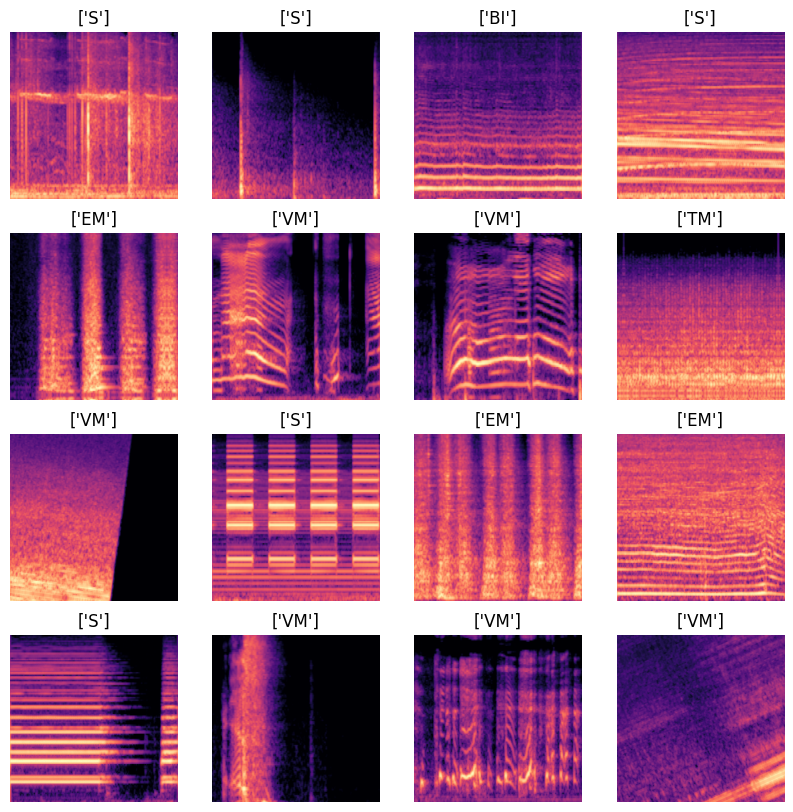

Batch sample for iteration training images 2:


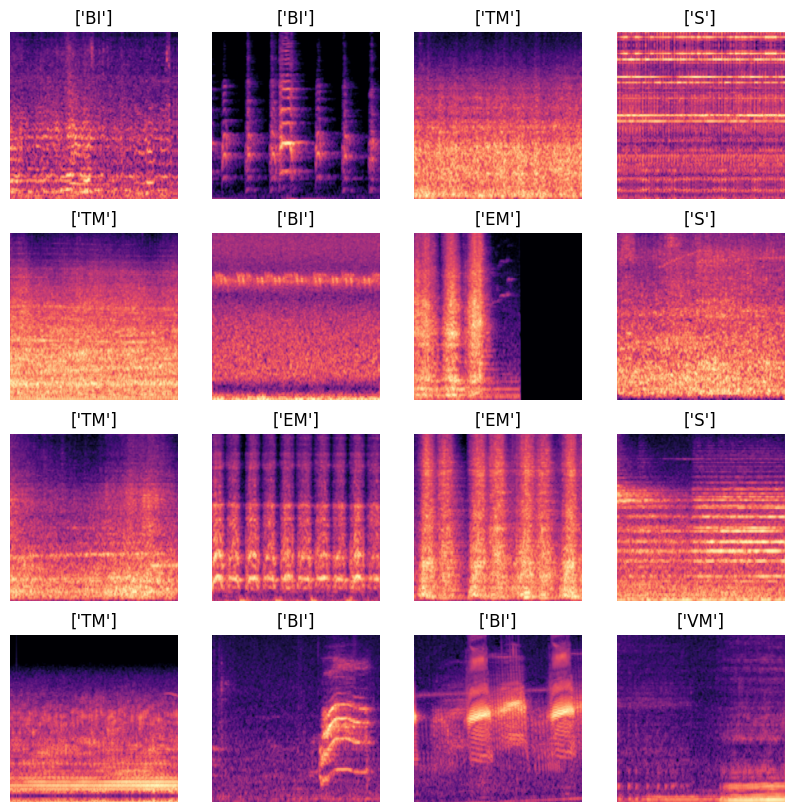

Batch sample for iteration training images 3:


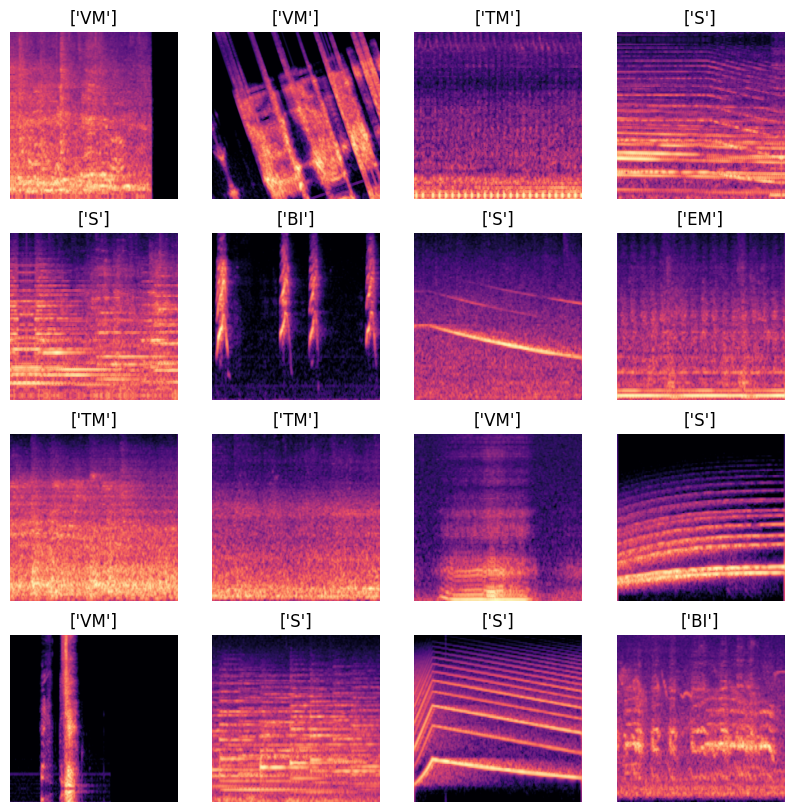

Batch sample for iteration training images 4:


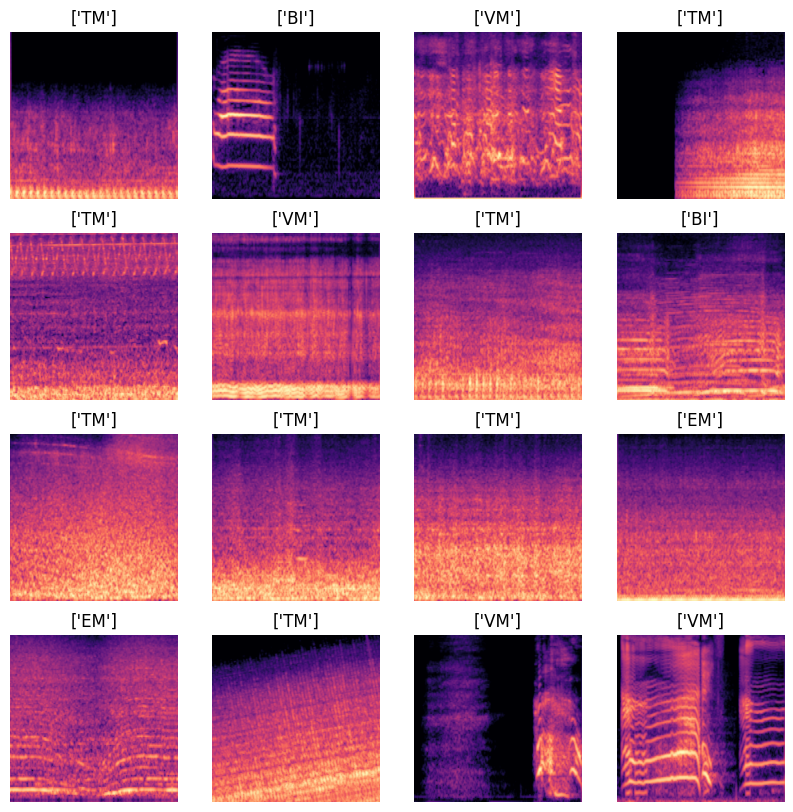

Batch sample for iteration training images 5:


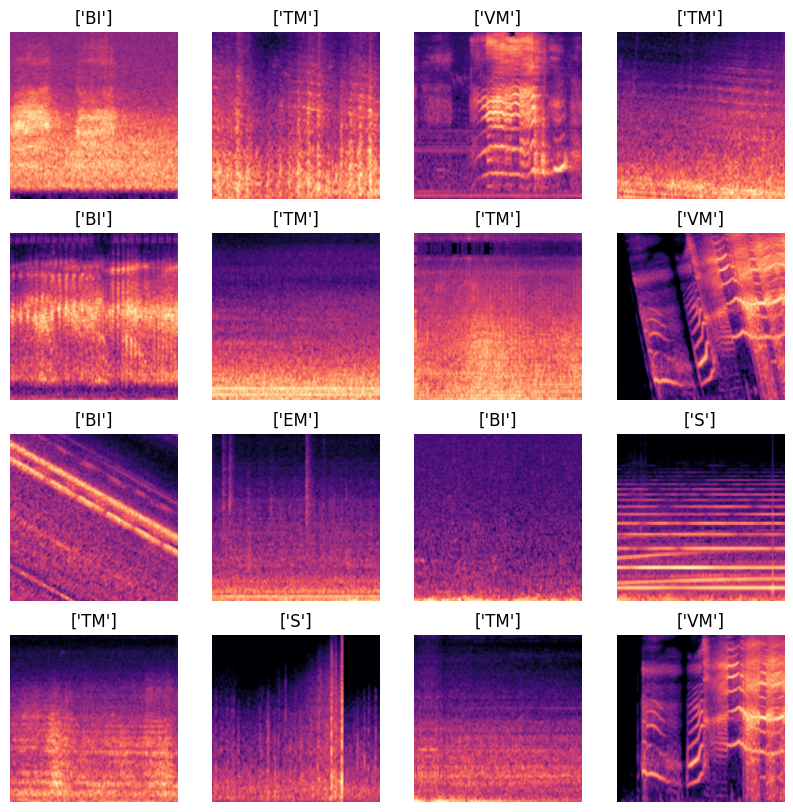

In [22]:
# PREPARE TRAINING IMAGES FOR EACH ITERATION
# The ‘prepare_for_training’ function is applied to the labelled datasets to finally have the training images ready.

train_datasets = []

# Prep dataset iterations and display some PNGs
for i, labeled_ds in enumerate([labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5], start=1):  # Iterar de 1 a 5
    train_ds = prepare_for_training(labeled_ds, repeat=None)  
    image_batch, label_batch = next(iter(train_ds))  
    
    # Show the batch of images and tags
    print(f"Batch sample for iteration training images {i}:")
    show_batch(image_batch, label_batch)  
    plt.show()  

    # We store the result
    train_datasets.append(train_ds)

# Access to the prepared training datasets
train_ds_1, train_ds_2, train_ds_3, train_ds_4, train_ds_5 = train_datasets

# Validation data

In [23]:
# The number of images in fold_1 (validation) is counted. 
val_image_count = len(list(fold_1.glob('*/*.png')))
val_image_count

1116

In [24]:
# Go through the subfolders of fold_1 and get their names
CLASS_NAMES = np.array([item.name for item in fold_1.iterdir() if item.is_dir()])
print(CLASS_NAMES)

['BI' 'EM' 'S' 'TM' 'VM']


In [25]:
# The 1./255 is to convert from uint8 to float32 in the range [0,1].
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
STEPS_PER_EPOCH = np.ceil(val_image_count/BATCH_SIZE)

In [26]:
# LISTS WITH PATHS TO THE 5 FOLDS

# Initialize lists for each fold
folds_val = {f"fold_{i+1}": [] for i in range(5)}

# Iterate over each fold
for i in range(5):
    # List files in the subfolders of each fold: 'BI', 'EM', 'S', 'TM', 'VM'
    list_ds = tf.data.Dataset.list_files(os.path.join(data_dir, f'fold_{i+1}', '*/*'))
    
    # Store the image paths in the corresponding list
    for f in list_ds:
        folds_val[f"fold_{i+1}"].append(f.numpy().decode('utf-8'))

# Print the image count in each fold based on the stored paths
for key, paths in folds_val.items():
    print(f"{key}: {len(paths)} images")

fold_1: 1116 images
fold_2: 1115 images
fold_3: 1115 images
fold_4: 1114 images
fold_5: 1114 images


In [27]:
# LISTS WITH VALIDATION IMAGE PATHS

# Create lists for each iteration so that each iteration uses one of the folds
list_ds_it_1 = folds_list["fold_1"]
list_ds_it_2 = folds_list["fold_2"]
list_ds_it_3 = folds_list["fold_3"]
list_ds_it_4 = folds_list["fold_4"]
list_ds_it_5 = folds_list["fold_5"]

# Print the image count based on paths for each iteration
print(f"list_ds_it_1: {len(list_ds_it_1)} images")
print(f"list_ds_it_2: {len(list_ds_it_2)} images")
print(f"list_ds_it_3: {len(list_ds_it_3)} images")
print(f"list_ds_it_4: {len(list_ds_it_4)} images")
print(f"list_ds_it_5: {len(list_ds_it_5)} images")

list_ds_it_1: 1116 images
list_ds_it_2: 1115 images
list_ds_it_3: 1115 images
list_ds_it_4: 1114 images
list_ds_it_5: 1114 images


In [28]:
# EXAMPLES OF 3 PNGs FOR EACH ITERATION

# Make copies of the lists first
list_ds_it_1_c = list_ds_it_1
list_ds_it_2_c = list_ds_it_2
list_ds_it_3_c = list_ds_it_3
list_ds_it_4_c = list_ds_it_4
list_ds_it_5_c = list_ds_it_5

# Loop to process 3 example image paths for each iteration
for i, ds_list in enumerate(
    [list_ds_it_1_c, list_ds_it_2_c, list_ds_it_3_c, list_ds_it_4_c, list_ds_it_5_c],
    start=1
):
    # Convert the list to a TensorFlow dataset
    dataset = tf.data.Dataset.from_tensor_slices(ds_list)
    
    # Shuffle the dataset and take 3 random samples
    print(f"Example image paths for iteration {i}:")
    for f in dataset.shuffle(buffer_size=len(ds_list)).take(3):
        print(f.numpy().decode('utf-8'))
    print()  # Blank line to separate outputs

Example image paths for iteration 1:
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_1\VM\aug_483_3-152007-D-20_seg1.png
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_1\VM\4-183882-A-28_seg1.png
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_1\BI\2-72547-D-14_seg2.png

Example image paths for iteration 2:
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_2\S\4-119647-B-48_seg2.png
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_2\VM\aug_1048_1-53444-A-28_seg2.png
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_2\VM\aug_1309_1-39937-A-28_seg2.png

Example image paths for iteration 3:
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_3\S\aug_1080_1-31482-B-42_seg2.png
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\fold_3\TM\3-68630-C-40_seg2.png
C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\CV_5\f

In [29]:
# LABEL THE DATASETS FOR EACH ITERATION
# Apply the map function to each list in a loop to process the paths,
# decoding the image and associating it with the corresponding label
labeled_datasets = []

for list_ds in [list_ds_it_1, list_ds_it_2, list_ds_it_3, list_ds_it_4, list_ds_it_5]:
    # Convert the list to a Dataset (to be able to apply the map function)
    dataset = tf.data.Dataset.from_tensor_slices(list_ds)
    
    # Label using the process_path function
    labeled_ds = dataset.map(process_path, num_parallel_calls=AUTOTUNE)
    
    # Store the result
    labeled_datasets.append(labeled_ds)

# Individual access to the labeled datasets
labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5 = labeled_datasets

# Review image shapes and labels in the labeled datasets for each iteration
for i, labeled_ds in enumerate([labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5], start=1):
    print(f"\nReviewing labeled_ds_it_{i}:")
    for image, label in labeled_ds.take(1):  # Take only one example from each dataset
        print("Image shape: ", image.numpy().shape)
        print("Label: ", label.numpy())


Reviewing labeled_ds_it_1:
Image shape:  (300, 300, 3)
Label:  [False False  True False False]

Reviewing labeled_ds_it_2:
Image shape:  (300, 300, 3)
Label:  [ True False False False False]

Reviewing labeled_ds_it_3:
Image shape:  (300, 300, 3)
Label:  [ True False False False False]

Reviewing labeled_ds_it_4:
Image shape:  (300, 300, 3)
Label:  [False False False False  True]

Reviewing labeled_ds_it_5:
Image shape:  (300, 300, 3)
Label:  [ True False False False False]


Sample batch of validation images for iteration 1:


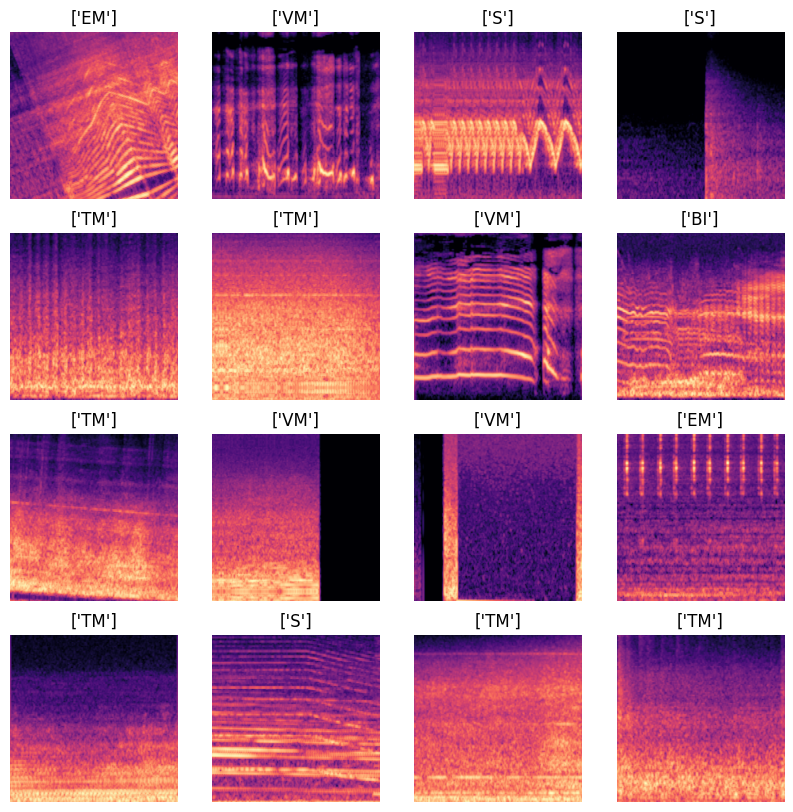

Sample batch of validation images for iteration 2:


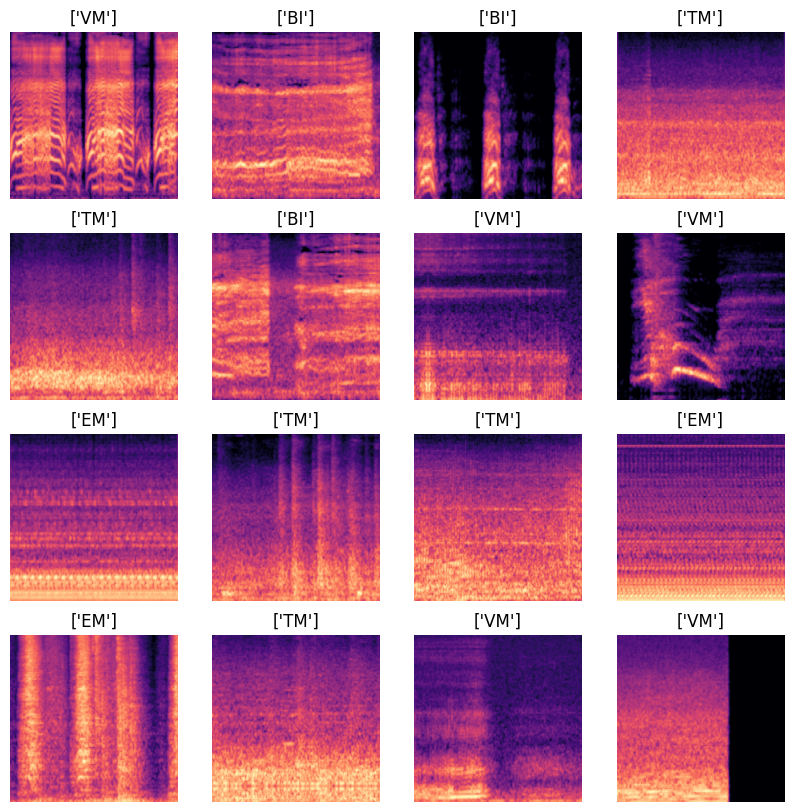

Sample batch of validation images for iteration 3:


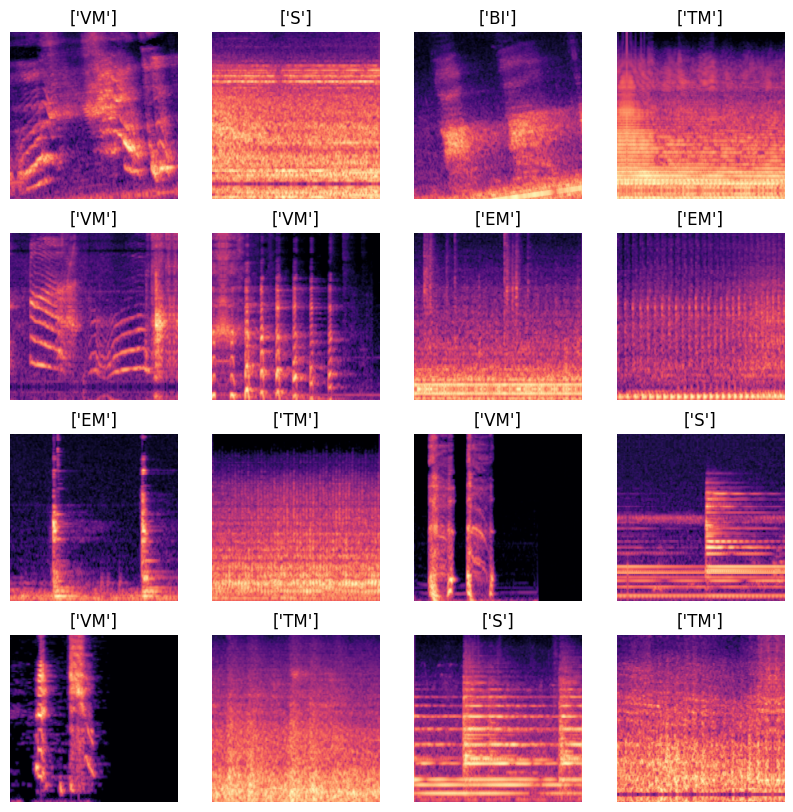

Sample batch of validation images for iteration 4:


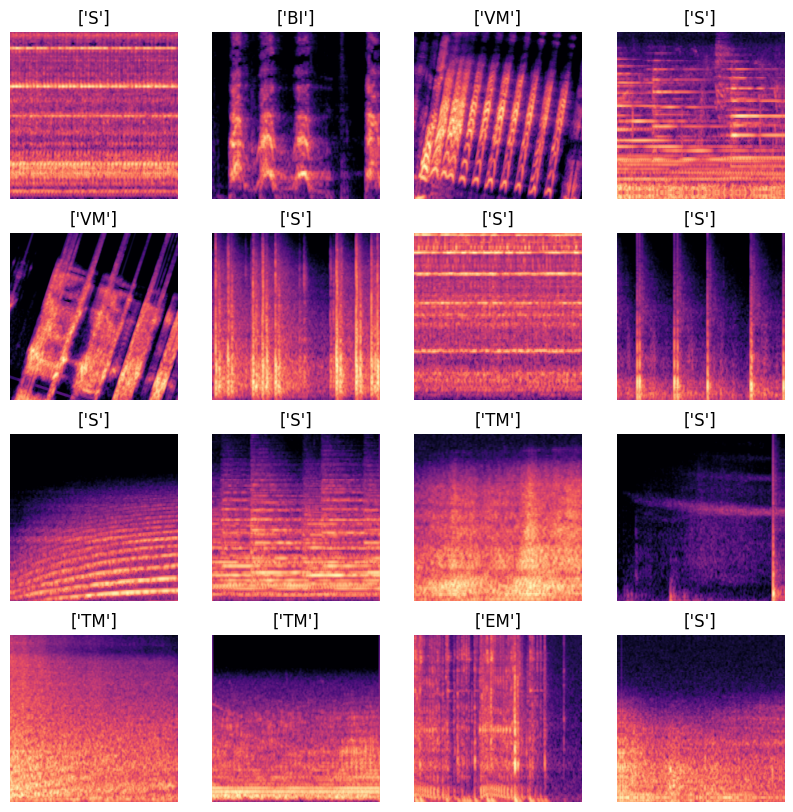

Sample batch of validation images for iteration 5:


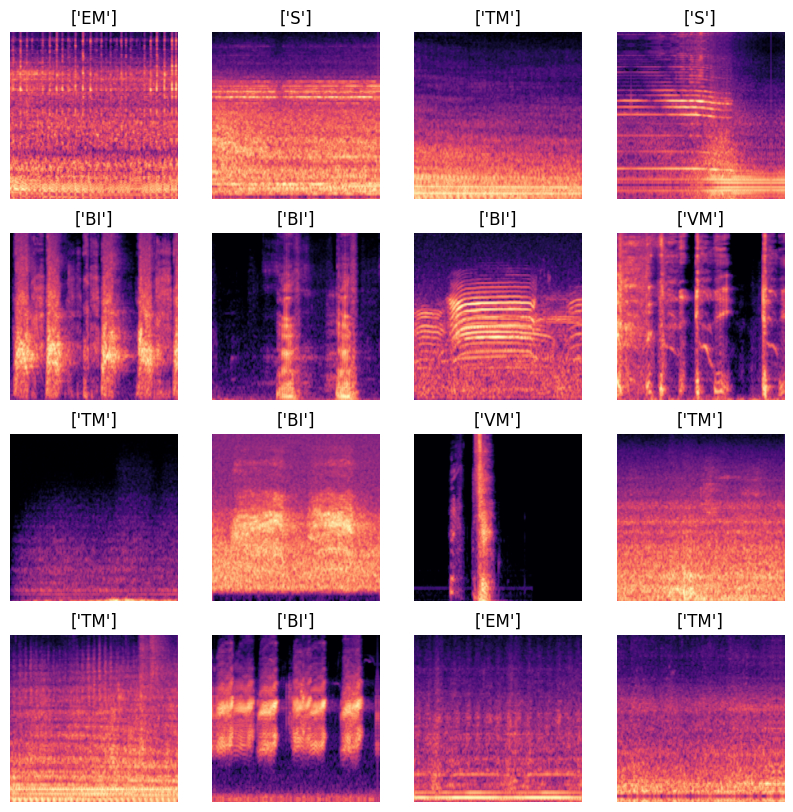

In [30]:
# PREPARE VALIDATION IMAGES FOR EACH ITERATION
# Apply the "prepare_for_training" function to the labeled datasets to finalize the validation images

validation_datasets = []

# Prepare dataset iterations and display some PNG samples
for i, labeled_ds in enumerate([labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5], start=1):
    validation_ds = prepare_for_training(labeled_ds)  # Prepare the dataset
    image_batch, label_batch = next(iter(validation_ds))  # Get a batch of images and labels

    # Display the batch of images and labels
    print(f"Sample batch of validation images for iteration {i}:")
    show_batch(image_batch, label_batch)  # Call the show_batch function
    plt.show()  # Show the plot and wait before continuing

    # Store the result
    validation_datasets.append(validation_ds)

# Access to the prepared validation datasets
validation_ds_1, validation_ds_2, validation_ds_3, validation_ds_4, validation_ds_5 = validation_datasets

# Data Verification

In [31]:
# NOW WE HAVE
print(train_ds_1)
print(train_ds_2)
print(train_ds_3)
print(train_ds_4)
print(train_ds_5)
print()
print(validation_ds_1)
print(validation_ds_2)
print(validation_ds_3)
print(validation_ds_4)
print(validation_ds_5)

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), 

# MODEL TRAINING

In [32]:
# number of target class : ABGIQ
n_classes = len(CLASS_NAMES)
print(n_classes)
print(CLASS_NAMES)

5
['BI' 'EM' 'S' 'TM' 'VM']


In [33]:
# Se combinan los datasets de entrenamiento y validación en pares
datasets = list(zip(train_datasets, validation_datasets))

In [34]:
# Aquí entrenamos cada fold usando los datasets previamente preparados
initial_epochs = 100  # Número reducido de epochs para pruebas
histories = []
all_metrics = []    

In [35]:
# Para determinar el número total de iteraciones/folds
n_folds = len(datasets)


Iteración 1:
Validación: validation_ds_1
Entrenamiento: train_ds_1

Entrenamiento en iteración 1...

Epoch 1/100
70/70 [==============================] - 40s 416ms/step - loss: 1.5521 - categorical_accuracy: 0.3187 - val_loss: 1.4294 - val_categorical_accuracy: 0.4005
Epoch 2/100
70/70 [==============================] - 25s 361ms/step - loss: 1.3681 - categorical_accuracy: 0.4607 - val_loss: 1.2800 - val_categorical_accuracy: 0.5242
Epoch 3/100
70/70 [==============================] - 25s 359ms/step - loss: 1.2342 - categorical_accuracy: 0.5411 - val_loss: 1.1703 - val_categorical_accuracy: 0.5681
Epoch 4/100
70/70 [==============================] - 22s 320ms/step - loss: 1.1354 - categorical_accuracy: 0.5973 - val_loss: 1.0900 - val_categorical_accuracy: 0.6057
Epoch 5/100
70/70 [==============================] - 22s 323ms/step - loss: 1.0823 - categorical_accuracy: 0.6116 - val_loss: 1.0263 - val_categorical_accuracy: 0.6380
Epoch 6/100
70/70 [==============================] - 22s 3

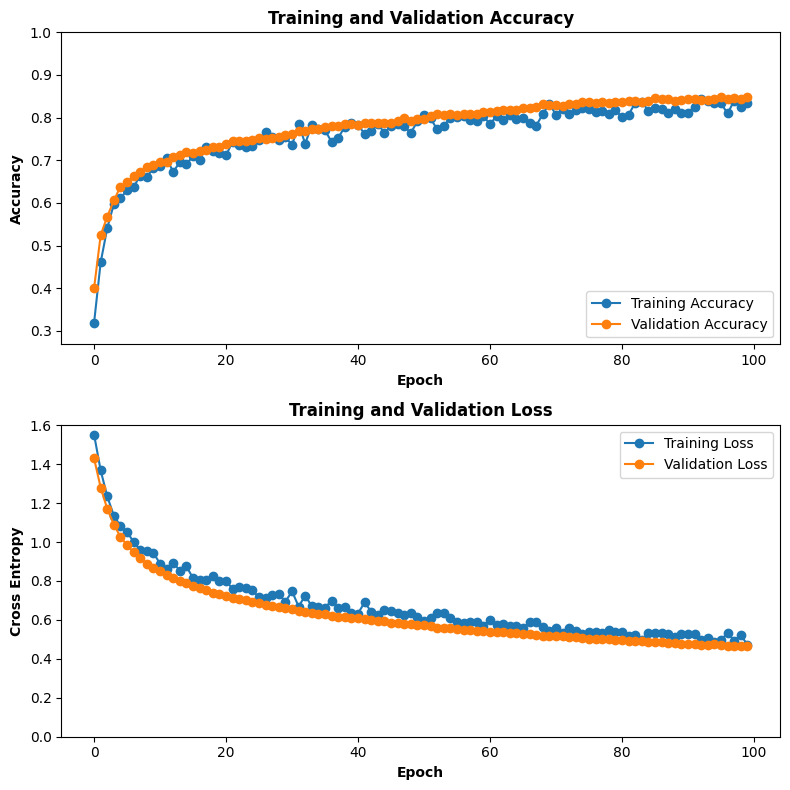

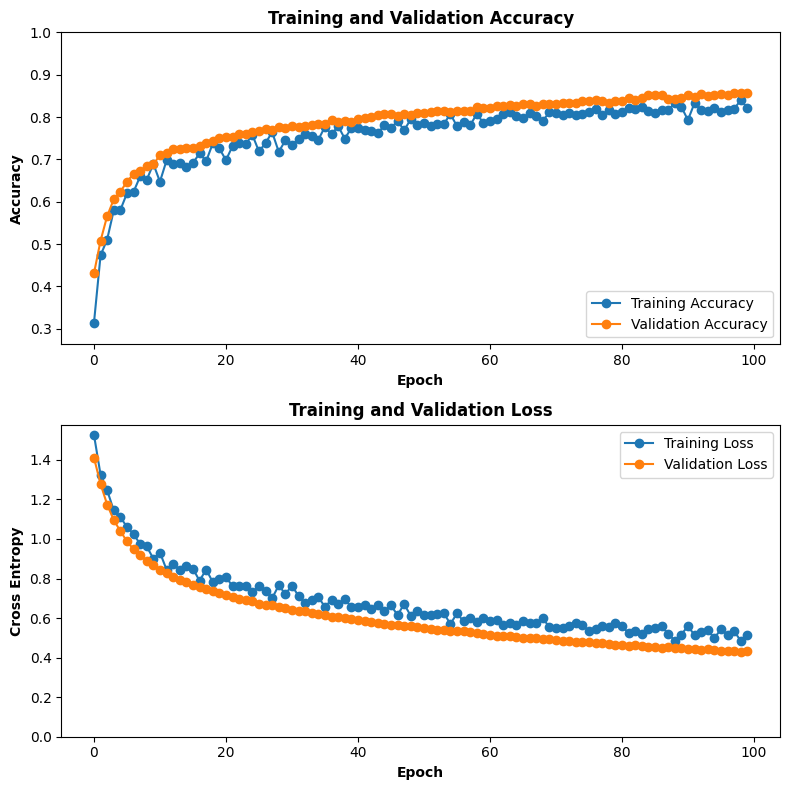

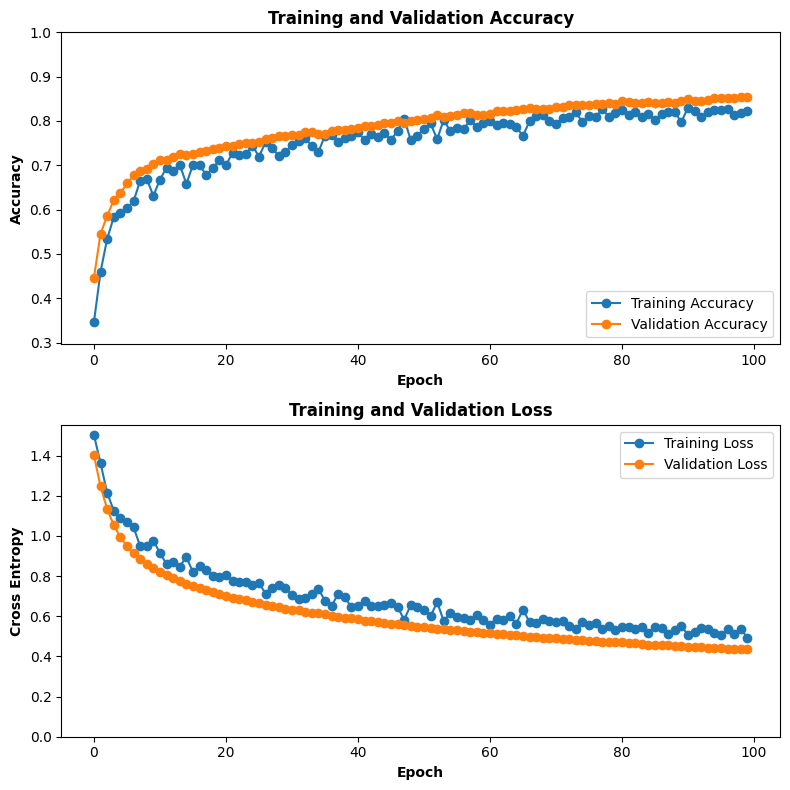

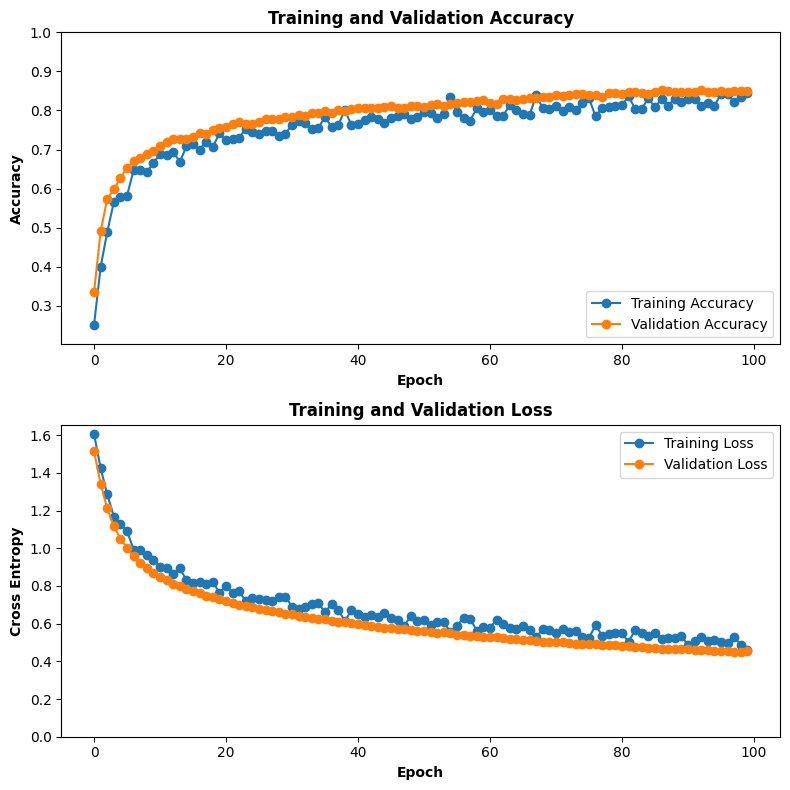

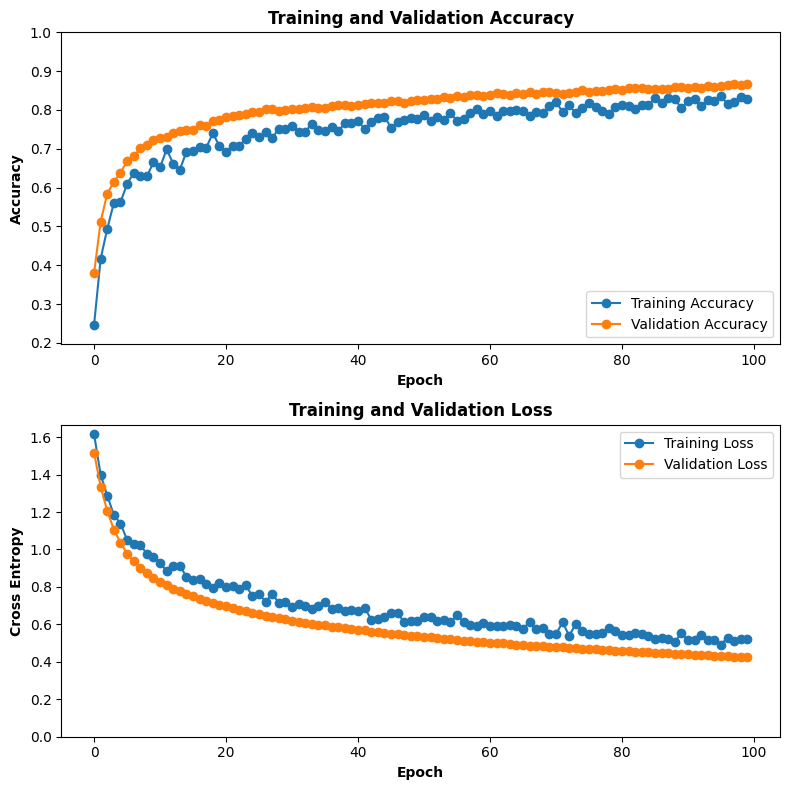

In [32]:
# ---------------------
# Bucle de entrenamiento con 5-fold CV
# ---------------------
for i, (train_ds, validation_ds) in enumerate(datasets, start=1):
    print(f"\nIteración {i}:")
    print(f"Validación: validation_ds_{i}")
    print(f"Entrenamiento: train_ds_{i}\n")
    print(f"Entrenamiento en iteración {i}...\n")

    # -----------------
    # Definición y compilación del modelo
    # -----------------
    base_model_output = EfficientNetB3(
        weights="imagenet",
        input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
        include_top=False
    )
    base_model_output.trainable = False

    model_fold = tf.keras.Sequential([
        base_model_output,
        layers.BatchNormalization(),
        tf.keras.layers.GlobalAveragePooling2D(),
        layers.Dropout(0.2, name="top_dropout"),
        Dense(n_classes, activation="softmax", name="predictions")
    ])

    model_fold.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
        metrics=[tf.keras.metrics.CategoricalAccuracy()],
        loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False)
    )

    # -----------------
    # Entrenamiento
    # -----------------
    history = model_fold.fit(
        train_ds,
        epochs=initial_epochs,
        validation_data=validation_ds,
        steps_per_epoch=np.ceil(image_count / BATCH_SIZE)
    )
    histories.append(history)

    # -----------------
    # Guardar pesos del modelo
    # -----------------
    model_save_path = os.path.join(cv_pth, f"model_fold_{i}.h5")
    model_fold.save_weights(model_save_path)
    print(f"Pesos guardados en: {model_save_path}")

    # -----------------
    # Recuperar curvas de métrica y pérdida
    # -----------------
    acc         = history.history['categorical_accuracy']
    val_acc     = history.history['val_categorical_accuracy']
    loss_values = history.history['loss']
    val_loss    = history.history['val_loss']

    # -----------------
    # Plot de Accuracy y Loss
    # -----------------
    plt.figure(figsize=(8, 8))

    plt.subplot(2, 1, 1)
    plt.plot(acc, marker='o', label='Training Accuracy')
    plt.plot(val_acc, marker='o', label='Validation Accuracy')
    plt.xlabel('Epoch', fontweight='bold')
    plt.ylabel('Accuracy', fontweight='bold')
    plt.title('Training and Validation Accuracy', fontweight='bold')
    plt.legend(loc='lower right')
    plt.ylim([min(min(acc), min(val_acc)) - 0.05, 1])

    plt.subplot(2, 1, 2)
    plt.plot(loss_values, marker='o', label='Training Loss')
    plt.plot(val_loss, marker='o', label='Validation Loss')
    plt.xlabel('Epoch', fontweight='bold')
    plt.ylabel('Cross Entropy', fontweight='bold')
    plt.title('Training and Validation Loss', fontweight='bold')
    plt.legend(loc='upper right')
    plt.ylim([0, max(max(loss_values), max(val_loss)) + 0.05])

    plt.tight_layout()

    # Guardar gráfico a 300 dpi
    fig_save_path = os.path.join(cv_pth, f"metrics_plot_fold_{i}.png")
    plt.savefig(fig_save_path, dpi=300, bbox_inches='tight')
    print(f"Plot de métricas guardado en: {fig_save_path}")

    # -----------------
    # Cálculo de F1-score en validación
    # -----------------
    y_true, y_pred = [], []
    for batch_images, batch_labels in validation_ds:
        preds_batch = model_fold.predict(batch_images, verbose=0)
        y_pred.extend(np.argmax(preds_batch, axis=1))
        y_true.extend(np.argmax(batch_labels.numpy(), axis=1))
    f1_val = f1_score(y_true, y_pred, average='macro')
    print(f"F1 Score (macro) VALIDACIÓN para la iteración {i}: {f1_val:.4f}")

    # -----------------
    # Almacenar todas las métricas de esta iteración
    # -----------------
    all_metrics.append({
        'fold': i,
        'train_accuracy': acc[-1],
        'train_loss': loss_values[-1],
        'val_accuracy': val_acc[-1],
        'val_loss': val_loss[-1],
        'f1_macro_val': f1_val
    })

In [33]:
# ---------------------
# Guardar CSV con todas las métricas
# ---------------------
results_df = pd.DataFrame(all_metrics)
csv_save_path = os.path.join(cv_pth, "final_metrics.csv")
results_df.to_csv(csv_save_path, index=False)

print(f"\nMétricas finales guardadas en: {csv_save_path}")
print("===== DataFrame de métricas finales =====")
print(results_df)


Métricas finales guardadas en: C:\Users\cadur\Downloads\Urbansonic\ESC_50\1_CNN_Training\RESULT\CV_5_folds\final_metrics.csv
===== DataFrame de métricas finales =====
   fold  train_accuracy  train_loss  val_accuracy  val_loss  f1_macro_val
0     1        0.834821    0.473658      0.849462  0.464146      0.846215
1     2        0.822321    0.513153      0.856502  0.431148      0.848708
2     3        0.821429    0.492840      0.854708  0.437078      0.849773
3     4        0.845536    0.462399      0.850090  0.453007      0.845178
4     5        0.828571    0.522551      0.867145  0.423840      0.861962


# Matrix de confusion

===== Métricas por Clase =====
    precision    recall  f1-score
BI   0.789474  0.576923  0.666667
EM   0.762500  0.762500  0.762500
S    0.890909  0.816667  0.852174
TM   0.651786  0.986486  0.784946
VM   0.892857  0.699301  0.784314



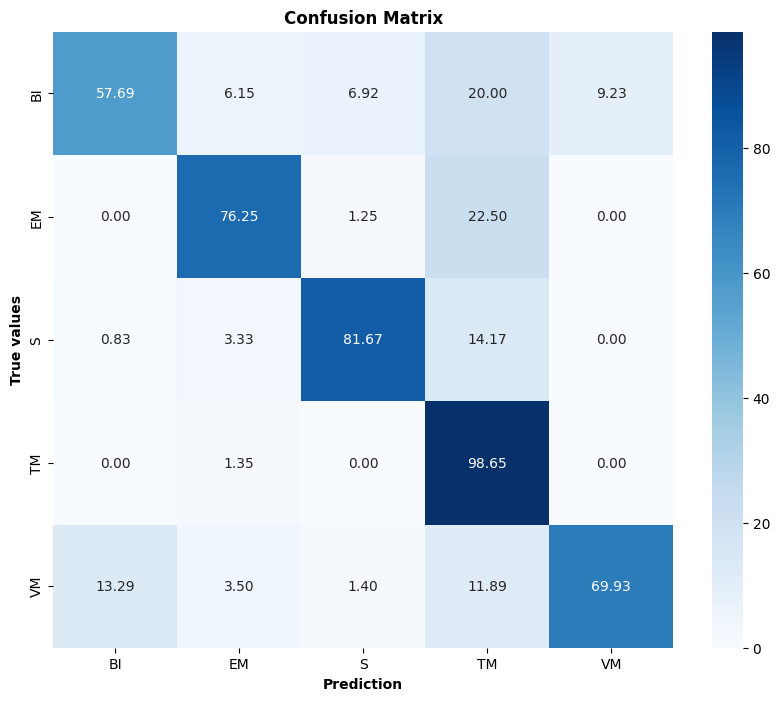

In [ ]:
# Configuración de rutas y parámetros
TEST_DIR = r"C:\Users\cadur\Downloads\Urbansonic\ESC_50\0_Mels_Gen\RESULT\Split\test"
WEIGHTS_PATH = r"C:\Users\cadur\Downloads\Urbansonic\ESC_50\1_CNN_Training\RESULT\CV_5_folds\model_fold_5.h5"

BATCH_SIZE = 16
IMG_HEIGHT = 300
IMG_WIDTH = 300

# Orden de clases tal como se utilizó en el entrenamiento
CLASS_NAMES = np.array(['BI', 'EM', 'S', 'TM', 'VM'])

# Funciones de preprocesamiento
def get_label(file_path):
    parts = tf.strings.split(file_path, os.path.sep)
    return parts[-2] == CLASS_NAMES  # Vector booleano de etiquetas

def decode_img(img):
    img = tf.image.decode_png(img, channels=3)
    img = tf.cast(img, tf.float32)
    img = tf.image.resize(img, [IMG_HEIGHT, IMG_WIDTH])
    return img

def process_path(file_path):
    label = get_label(file_path)
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img, label

# Preparar dataset de prueba
test_dir = Path(TEST_DIR)
test_list_ds = tf.data.Dataset.list_files(str(test_dir / '*/*.png'), shuffle=False)
test_ds = test_list_ds.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Reconstruir el modelo
def crear_modelo():
    base_model = tf.keras.applications.EfficientNetB3(
        include_top=False,
        weights=None,
        input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)
    )
    base_model.trainable = False  # Congelar base

    modelo = tf.keras.Sequential([
        base_model,
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(CLASS_NAMES), activation='softmax')
    ])
    return modelo

modelo = crear_modelo()
modelo.load_weights(WEIGHTS_PATH)  # Cargar pesos entrenados

# Obtener predicciones y etiquetas verdaderas
y_true = []
y_pred = []

for imagenes, etiquetas in test_ds:
    predicciones = modelo.predict(imagenes, verbose=0)
    y_true.extend(tf.argmax(etiquetas, axis=1).numpy())
    y_pred.extend(tf.argmax(predicciones, axis=1).numpy())

# CALCULAR REPORTE DE MÉTRICAS POR CLASE (Precision, Recall, F1-score)
report_dict = classification_report(
    y_true,
    y_pred,
    target_names=CLASS_NAMES,
    output_dict=True
)

# Convertir el reporte a un DataFrame
df_report = pd.DataFrame(report_dict).T

# Filtrar solo las filas correspondientes a cada clase
df_report_clases = df_report.loc[CLASS_NAMES]

# Multiplicar los valores por 100 para expresarlos en porcentajes
df_report_clases[['precision', 'recall', 'f1-score']] = df_report_clases[['precision', 'recall', 'f1-score']]

# Imprimir la tabla en consola
print("===== Métricas por Clase =====")
print(df_report_clases[['precision', 'recall', 'f1-score']])
print()

# CALCULAR Y VISUALIZAR MATRIZ DE CONFUSIÓN NORMALIZADA EN PORCENTAJE
cm = confusion_matrix(y_true, y_pred, labels=np.arange(len(CLASS_NAMES)))
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

plt.figure(figsize=(10, 8))
sns.heatmap(cm_percent, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
plt.xlabel('Prediction', fontweight='bold')
plt.ylabel('True values', fontweight='bold')
plt.title('Confusion Matrix', fontweight='bold')

# Guardar imagen a 300 dpi
output_path = r'C:\Users\cadur\Downloads\Urbansonic\ESC_50\1_CNN_Training\RESULT\CV_5_folds\confusion_matrix.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

In [35]:
# Matriz de confusión (valores absolutos)
cm = confusion_matrix(y_true, y_pred, labels=np.arange(len(CLASS_NAMES)))
df_cm = pd.DataFrame(cm, index=CLASS_NAMES, columns=CLASS_NAMES)

print("===== Matriz de Confusión (valores absolutos) =====")
print(df_cm)

# Matriz normalizada (% por clase verdadera)
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
df_cm_percent = pd.DataFrame(np.round(cm_percent, 2), index=CLASS_NAMES, columns=CLASS_NAMES)

print("\n===== Matriz de Confusión Normalizada (%) =====")
print(df_cm_percent)

===== Matriz de Confusión (valores absolutos) =====
    BI  EM   S   TM   VM
BI  75   8   9   26   12
EM   0  61   1   18    0
S    1   4  98   17    0
TM   0   2   0  146    0
VM  19   5   2   17  100

===== Matriz de Confusión Normalizada (%) =====
       BI     EM      S     TM     VM
BI  57.69   6.15   6.92  20.00   9.23
EM   0.00  76.25   1.25  22.50   0.00
S    0.83   3.33  81.67  14.17   0.00
TM   0.00   1.35   0.00  98.65   0.00
VM  13.29   3.50   1.40  11.89  69.93


# Curva ROC

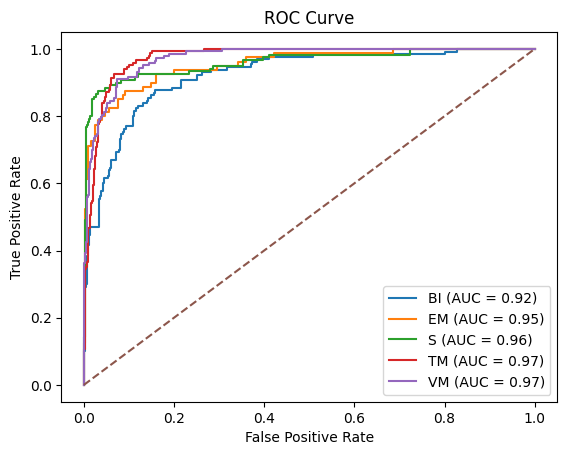

In [ ]:
y_true_int = []
y_score = []
for images, labels in test_ds:
    preds = modelo.predict(images, verbose=0)
    y_score.extend(preds)
    y_true_int.extend(tf.argmax(labels, axis=1).numpy())

y_score = np.array(y_score)
y_true_int = np.array(y_true_int)

# Binarizar etiquetas para multiclasificación
y_true_bin = label_binarize(y_true_int, classes=range(len(CLASS_NAMES)))

# Calcular curvas ROC y AUC para cada clase
fpr = {}
tpr = {}
roc_auc = {}
for i, class_name in enumerate(CLASS_NAMES):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Graficar curva ROC por clase
plt.figure()
for i, class_name in enumerate(CLASS_NAMES):
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--')  # Línea de aleatorio
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')

# Guardar la figura
output_path_roc = r'C:\Users\cadur\Downloads\Urbansonic\ESC_50\1_CNN_Training\RESULT\CV_5_folds\roc_curve.png'
plt.savefig(output_path_roc, dpi=300, bbox_inches='tight')
plt.show()